## Working with Navigation Meshes

**Date Modified: February 21 2025**

In [2]:
import sys
import os

# Get the absolute path to the 'awpy' folder
awpy_path = os.path.abspath(os.path.join(os.getcwd(), '..', '..', 'awpy'))

# Add it to sys.path
if awpy_path not in sys.path:
    sys.path.insert(0, awpy_path)

# Confirm it's in the path
#print(sys.path)

Navigation meshes are a data structure which encode information about a space in a 3D world. Typically, they're used for helping bots navigate through that world. Essentially, these navigation meshes are graphs, where a navigable region of the map (a "tile" aka the nodes on the graph) is connected to others (the edges on the graph).

In CS2, a navigation mesh comes in the form of a .nav file. In our library, we provide the navigation mesh information for the most popular maps. If a map is missing, feel free to open up a feature request on Github issues. The map data is found in the awpy.data module. The main pieces of data are outlined below. After outlining the data, we show how we can use navigation meshes to calculate distances in CS2.

### `from awpy.data.map_data import MAP_DATA`

`MAP_DATA` is a JSON which contains information that is used to scale coordinates for visualization. The top-level keys are maps, and the objects contained within have the following keys: `pos_x`, `pos_y`, `scale`, `rotation`, `zoom`, `lower_level_max_units` key. An example looks like:

```json
{
    ...,
    "de_overpass": {
        'pos_x': -4831,
        'pos_y': 1781,
        'scale': 5.2,
        'rotate': 0,
        'zoom': 0,
        'lower_level_max_units': -inf
    },
    ...
}
```

### Basic Nav Mesh Functionality in awpy

#### Show Nav Mesh JSON format

##### Nav object

`Nav` object contains two attributes - version and areas. Version states the version of the nav mesh file used. Areas is a dictionary where the key is an integer (specifcally `NavArea` id) and the value is the `NavArea` object. All of the NavArea objects for a given map together describe the navigable surfaces for that map.

In [3]:
import awpy.nav

In [4]:
path_to_nav_file = "../../awpy/data/de_dust2"
dust_2_nav = awpy.nav.Nav(path=path_to_nav_file)
dust_2_nav

Nav(version=35.1, areas=2248)

##### NavArea object

`NavArea` object contains a few attributes: `id`, `connected_ids`, `points`, and `size`). Here is what those attributes mean:
* `id` - integer representing the id for the tile for the map
* `connected_ids` - ids of NavArea objects/navigation tiles who are connected to the NavArea object
* `points` - 4 points describing the shape of the NavArea object/navigation tile
* `size` - size of the navigation tile in the map

A more readable version of a NavArea object can be created by calling `NavAreaObject.to_dict()`. More info can be found in `awpy.nav`.

In [5]:
print(dust_2_nav.areas[832])
print(' ')
print((dust_2_nav.areas[832].to_dict()))

NavArea(id=832, connected_ids=[747, 828, 876, 919, 941, 975], points=[(1618.9998779296875, 710.9998168945312, 84.00000762939453), (1589.0, 710.9998168945312, 84.00000762939453), (1589.0, 343.499755859375, 84.00000762939453), (1618.9998779296875, 343.499755859375, 84.00000762939453)], size=11024.956970207393)
 
{'area_id': 832, 'hull_index': 0, 'dynamic_attribute_flags': 0, 'corners': [{'x': 1618.9998779296875, 'y': 710.9998168945312, 'z': 84.00000762939453}, {'x': 1589.0, 'y': 710.9998168945312, 'z': 84.00000762939453}, {'x': 1589.0, 'y': 343.499755859375, 'z': 84.00000762939453}, {'x': 1618.9998779296875, 'y': 343.499755859375, 'z': 84.00000762939453}], 'connections': [941, 828, 747, 876, 919, 975], 'ladders_above': [], 'ladders_below': []}


#### Visualize All Nav Mesh Tiles

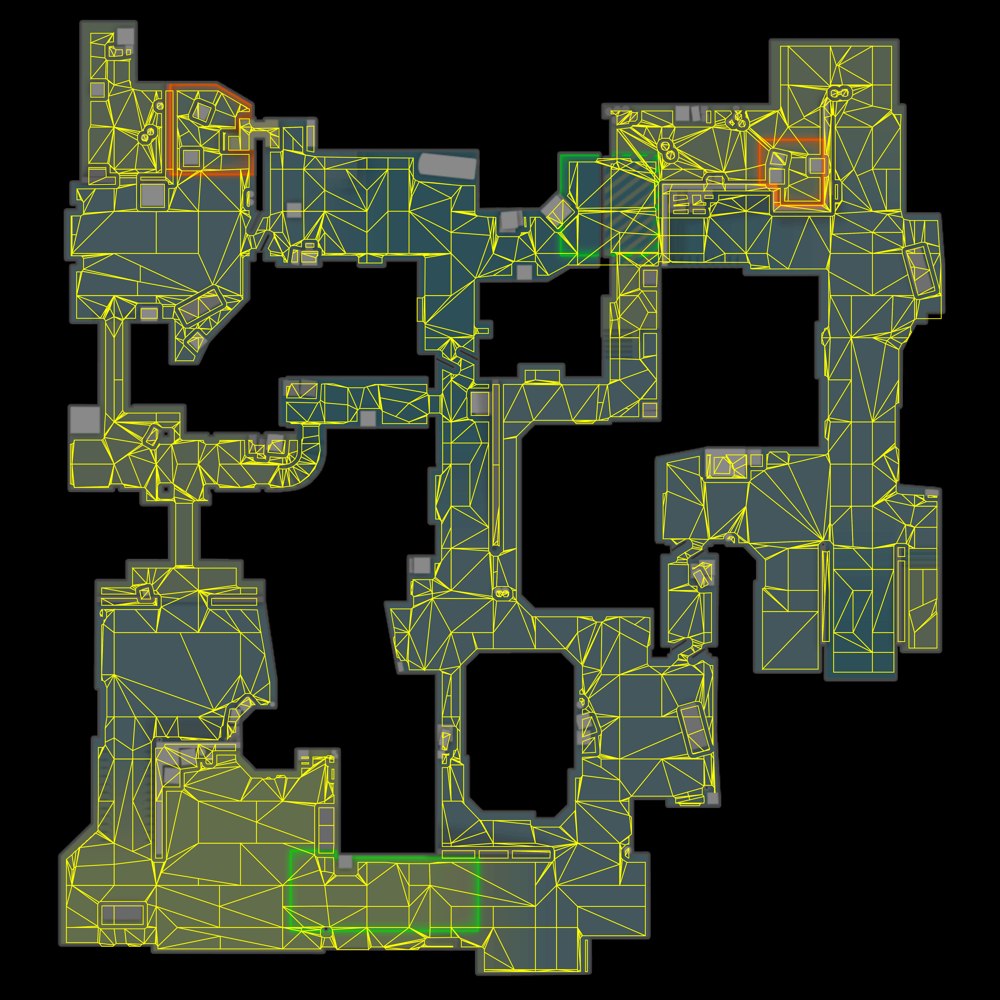

In [6]:
'''
In this cell we will visualize all the nav mesh tiles on dust2
'''
import awpy.plot.tile
awpy.plot.tile.plot_map_tiles(map_name="de_dust2")

#### Save All Nav Mesh Visualization to File

In [7]:
'''
In this cell we will visualize all the nav mesh tiles on dust2
and save the resulting graphic to file
'''
from pathlib import Path
save_dir = Path("./tmp/sample_img.png")
awpy.plot.tile.plot_map_tiles(map_name="de_dust2", outpath=save_dir)

The visualization has been saved at /mnt/d/projects/fps/awpy/csgo/docs/examples/tmp/sample_img.png


#### Visualize Selected Nav Mesh Tile(s)

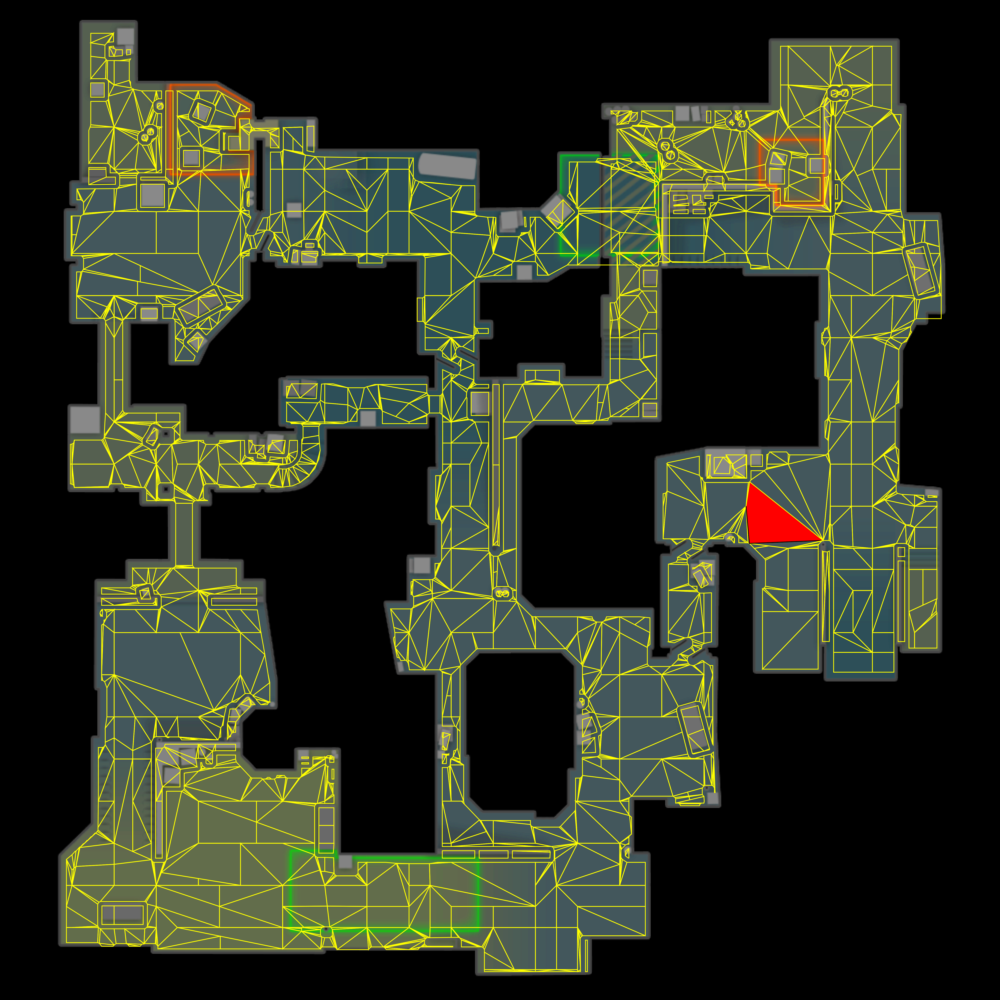

In [8]:
'''
In this cell we will visualize a nav mesh tiles (512 on dust2) 
'''
viz_map_name, tiles_to_visualize = "de_dust2", [512]
awpy.plot.tile.plot_map_tiles_selected(map_name=viz_map_name, selected_tiles=tiles_to_visualize)

In [9]:
'''
In this cell we will save the individual nav mesh tile visualization
to file
'''
viz_map_name, tiles_to_visualize = "de_dust2", [512]
save_dir = Path("./tmp/sample_img2.png")
awpy.plot.tile.plot_map_tiles_selected(map_name=viz_map_name, selected_tiles=tiles_to_visualize, outpath=save_dir)

The visualization has been saved at /mnt/d/projects/fps/awpy/csgo/docs/examples/tmp/sample_img2.png


#### NavArea Path Finding (+ Visualization)

##### NavArea Path Finding

The path between two NavArea objects in the same map can be easily found by utilizing `Nav.find_path`. The function is called on a Nav object (such as `dust_2_nav` in this notebook) and the arguments are two NavArea id's (representing the source and destination tiles in the path). The returned output is a list of NavArea objects which represent the path between the source and destination tiles. Instead of printing out this entire list below, we've chosen to just print out the length of the found path and the first/last tiles in the path (the source and destination tiles).

In [10]:
tile_path = dust_2_nav.find_path(512, 1430)
print(f"Total length of found path is {len(tile_path)} tiles")
print(f"First tile in path has id {tile_path[0].area_id} and the last tile in path has id {tile_path[-1].area_id}")

Total length of found path is 14 tiles
First tile in path has id 512 and the last tile in path has id 1430


##### NavArea Path Visualization

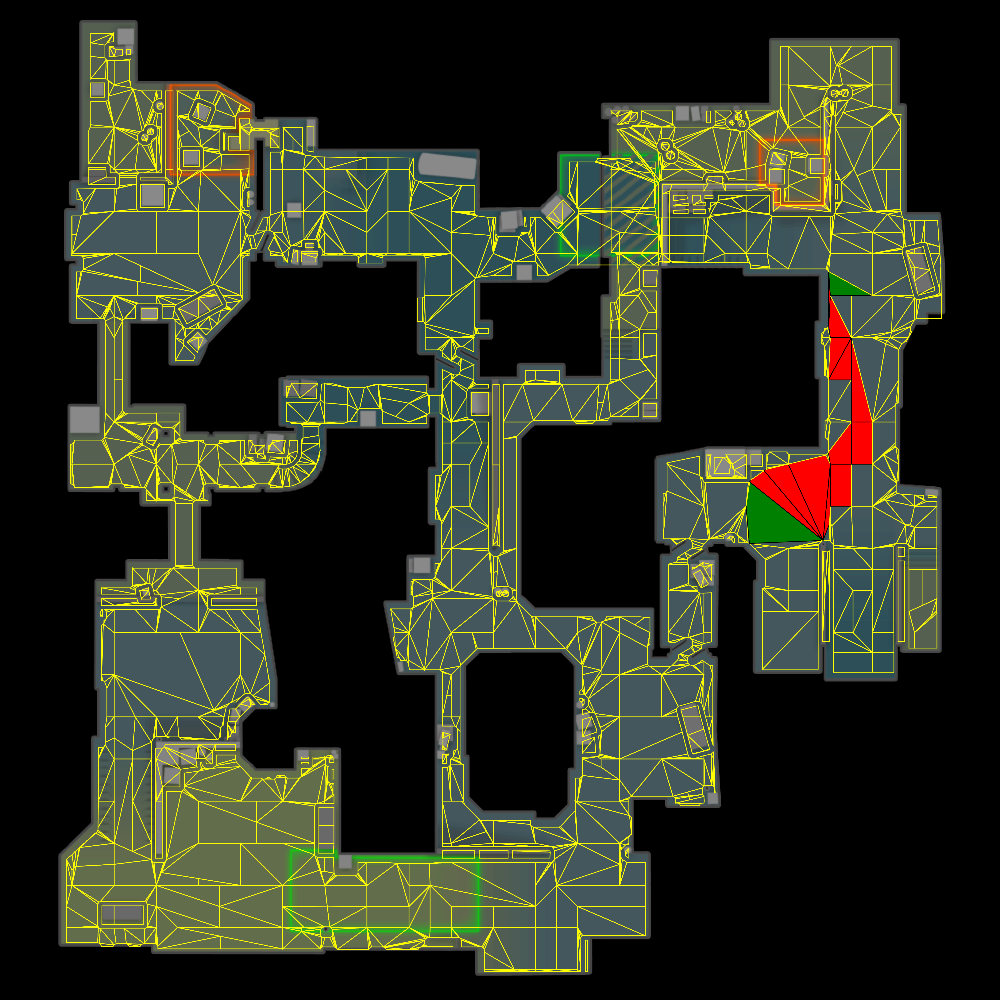

In [11]:
'''
Here we will visualize the previously calculated path between two tiles on dust2: 512 and 1430.
The source/destination tiles will be colored in green with black edges while all other tiles
in the path will be colored in red with black edges.

To call the visualization function we will need to extract just the area_id for each NavArea object
in the found path.
'''

tile_path = dust_2_nav.find_path(512, 1430)
tile_path_ids = [tile.area_id for tile in tile_path]
viz_map_name = 'de_dust2'
awpy.plot.tile.plot_map_tiles_selected(map_name=viz_map_name, selected_tiles=tile_path_ids)

In [12]:
'''
We can also save this visualization to file. Pass in a directory as a Path object to the 
output_dir argument in plot_map_tiles_selected and the visualization will be saved in that directory
'''

save_dir = Path("./tmp/sample_img2.png")
awpy.plot.tile.plot_map_tiles_selected(map_name=viz_map_name, selected_tiles=tile_path_ids, outpath=save_dir)

The visualization has been saved at /mnt/d/projects/fps/awpy/csgo/docs/examples/tmp/sample_img2.png
